In [1]:
import glob
from warnings import simplefilter
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
from tqdm.notebook import tqdm


simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

In [2]:
def clean_cloudy_line_file(filename, name='emissivity'):
    '''
    My method for making cloudy line emissivity files more user friendly. 
    To pull emissivities for a given line from each grid step, 
    read in the df and use df.loc['HE_2_1640.00A'] format. 
    '''
    df = pd.read_csv(filename, sep='\t+', header=0, names=[name], comment='#', engine='python')
    df = df[df.index.str.contains('iteration') == False]
    df.index = df.index.str.replace('  ', '_')
    df.index = df.index.str.replace(' ', '_')
    df.index = df.index.str[:-1]
    
    return df

def ohno_backhaus_2022(logneiiioii):
	'''
	defining the unv087 dividing line from Backhaus et al. 2021.
	Singularity at log(NeIII/OII) = 0.285
	'''    
	return 0.35/(2.8*logneiiioii - 0.8) + 0.64


def plot_ohno_backhaus_2022(ax):
    xohno = np.linspace(-2,0.285, 1000)
    ax.plot(xohno, ohno_backhaus_2022(xohno), c='black', ls='-', lw=3, label='Backhaus et al. 2022', zorder=-9)
  

def bpt_kewley_2001(logniiha):
	'''
	Defining the BPT AGN/SF dividing line from Kewley 2001.
	'''    
	return 0.61/(logniiha - 0.47) + 1.19   

def plot_bpt_kewley_2001(ax):
    x = np.linspace(-2,0.46, 1000)
    ax.plot(x, bpt_kewley_2001(x), c='black', ls=':', lw=3, label='Kewley et al. 2001', zorder=-9)
    

def bpt_kauffmann_2003(logniiha):
	'''
	Defining the BPT AGN/SF dividing line from Kauffmann 2003.
	'''    
	return 0.61/(logniiha - 0.05) + 1.3    

    
def plot_bpt_kauffmann_2003(ax):
    x = np.linspace(-2,0.04, 1000)
    ax.plot(x, bpt_kauffmann_2003(x), c='black', ls='-', lw=3, label='Kauffmann et al. 2003', zorder=-9)

def vo87_trump_2015(logsiiha):
	'''
	Defining the unVO87 AGN/SF dividing line from Trump et al. 2015.
	Singularity at log(SII/Ha) = 0.0917
	'''    
	return 0.48/(1.09*logsiiha - 0.10) + 1.3    


def plot_vo87_trump_2015(ax):
    x = np.linspace(-2,0.09, 1000)
    ax.plot(x, vo87_trump_2015(x), c='black', ls='-', lw=3, label= 'Trump et al. 2015', zorder=-9)
	

In [3]:
BPASS_135_300_single_hden3_path = "/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf135_300_burst_single_models/"
path_string = "/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf135_300_burst_single_models/sedBPASSv2.2.1_imf135_300_burst_single.ascii_age11.0_zstar0.05_hden3_z0.05_logU-4.0.ilin"

parameters = path_string.replace(BPASS_135_300_single_hden3_path, '').replace('.ilin', '')
logU = parameters.rsplit('logU')[-1]
zgas = parameters.replace(f'_logU{logU}', '').rsplit('z')[-1]
hden = parameters.replace(f'_z{zgas}_logU{logU}', '').rsplit('hden')[-1]
zstar = parameters.replace(f'_hden{hden}_z{zgas}_logU{logU}', '').rsplit('zstar')[-1]
age = parameters.replace(f'_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('age')[-1]
sed = parameters.replace(f'_age{age}_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('sed')[-1]


sed

'BPASSv2.2.1_imf135_300_burst_single.ascii'

In [4]:
BPASS_135_300_single_hden3_path = "/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf135_300_burst_single_models/"

catalog = pd.DataFrame()
for ilin in tqdm(glob.glob(f"{BPASS_135_300_single_hden3_path}**.ilin")):
    parameters = ilin.replace(BPASS_135_300_single_hden3_path, '').replace('.ilin', '')
    try:
        catalog[parameters] = clean_cloudy_line_file(ilin, name=parameters).copy()
    except:
        print(ilin)
        pass

linesdf = catalog.T
linesdf['logU'] = None
linesdf['zgas'] = None
linesdf['hden'] = None
linesdf['zstar'] = None
linesdf['age'] = None
linesdf['sed'] = None

for id, row in linesdf.iterrows():
    logU = float(id.rsplit('logU')[-1])
    zgas = float(id.replace(f'_logU{logU}', '').rsplit('z')[-1])
    hden = int(id.replace(f'_z{zgas}_logU{logU}', '').rsplit('hden')[-1])
    zstar = float(id.replace(f'_hden{hden}_z{zgas}_logU{logU}', '').rsplit('zstar')[-1])
    age = float(id.replace(f'_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('age')[-1])
    sed = str(id.replace(f'_age{age}_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('sed')[-1])
    linesdf.loc[id, 'logU'] = logU
    linesdf.loc[id, 'zgas'] = zgas
    linesdf.loc[id, 'hden'] = hden
    linesdf.loc[id, 'zstar'] = zstar
    linesdf.loc[id, 'age'] = age
    linesdf.loc[id, 'sed'] = sed

linesdf


  0%|          | 0/4563 [00:00<?, ?it/s]

/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf135_300_burst_single_models/sedBPASSv2.2.1_imf135_300_burst_single.ascii_age11.0_zstar0.05_hden3_z0.05_logU-4.0.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf135_300_burst_single_models/sedBPASSv2.2.1_imf135_300_burst_single.ascii_age11.0_zstar0.05_hden3_z0.05_logU-2.0.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf135_300_burst_single_models/sedBPASSv2.2.1_imf135_300_burst_single.ascii_age11.0_zstar0.05_hden3_z0.05_logU-1.5.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf135_300_burst_single_models/sedBPASSv2.2.1_imf135_300_burst_single.ascii_age11.0_zstar0.05_hden3_z0.05_logU-3.5.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_mode

,N_4_765.147A,N_3_991.000A,C_3_977.020A,C_2_904.142A,C_2_1036.34A,C_2_1037.02A,S_4_1062.66A,H_1_1215.68A,N_5_1238.82A,N_5_1242.80A,...,O_3_1666.15A,O_5_1218.34A,si_3_1892.03A,BLND_2335.00A,logU,zgas,hden,zstar,age,sed
sedBPASSv2.2.1_imf135_300_burst_single.ascii_age6.2_zstar0.4_hden3_z0.4_logU-1.75,1.457300e-03,2.959000e-04,1.592200e-02,0.001690,0.002182,0.002578,5.535300e-04,2.214100,0.000000,0.000000,...,7.594600e-03,0.000000,2.284300e-02,3.941600e-03,-1.75,0.4,3,0.4,6.2,BPASSv2.2.1_imf135_300_burst_single.ascii
sedBPASSv2.2.1_imf135_300_burst_single.ascii_age7.1_zstar2.0_hden3_z2.0_logU-3.25,0.000000e+00,0.000000e+00,8.099100e-08,0.000005,0.000046,0.000089,0.000000e+00,0.005627,0.000000,0.000000,...,2.409000e-17,0.000000,8.471900e-10,9.117600e-10,-3.25,2.0,3,2.0,7.1,BPASSv2.2.1_imf135_300_burst_single.ascii
sedBPASSv2.2.1_imf135_300_burst_single.ascii_age9.5_zstar0.2_hden3_z0.2_logU-1.75,1.710900e-03,4.314000e-03,2.306600e-02,0.000556,0.000914,0.001116,6.311900e-04,3.981600,0.001356,0.000927,...,7.559200e-02,0.000589,5.531200e-02,6.549600e-03,-1.75,0.2,3,0.2,9.5,BPASSv2.2.1_imf135_300_burst_single.ascii
sedBPASSv2.2.1_imf135_300_burst_single.ascii_age6.5_zstar0.5_hden3_z0.5_logU-2.5,1.427000e-04,1.238300e-05,2.966300e-03,0.000316,0.000602,0.000713,1.379300e-04,0.811260,0.000000,0.000000,...,6.549500e-04,0.000000,2.865600e-03,1.915200e-03,-2.5,0.5,3,0.5,6.5,BPASSv2.2.1_imf135_300_burst_single.ascii
sedBPASSv2.2.1_imf135_300_burst_single.ascii_age6.2_zstar0.25_hden3_z0.25_logU-2.75,4.231300e-05,3.280100e-06,7.657600e-04,0.000150,0.000194,0.000235,1.404300e-05,0.560750,0.000000,0.000000,...,7.102500e-04,0.000000,3.043000e-03,1.300300e-03,-2.75,0.25,3,0.25,6.2,BPASSv2.2.1_imf135_300_burst_single.ascii
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sedBPASSv2.2.1_imf135_300_burst_single.ascii_age6.6_zstar0.05_hden3_z0.05_logU-3.25,2.190400e-07,2.788200e-08,1.873000e-04,0.000038,0.000074,0.000099,1.341100e-07,0.234530,0.000000,0.000000,...,5.467600e-05,0.000000,3.893400e-04,1.916600e-04,-3.25,0.05,3,0.05,6.6,BPASSv2.2.1_imf135_300_burst_single.ascii
sedBPASSv2.2.1_imf135_300_burst_single.ascii_age6.4_zstar1.0_hden3_z1.0_logU-3.0,6.004900e-07,2.793400e-08,6.155700e-04,0.000150,0.000229,0.000275,1.232400e-06,0.293140,0.000000,0.000000,...,1.326500e-06,0.000000,4.036100e-05,1.788500e-04,-3.0,1.0,3,1.0,6.4,BPASSv2.2.1_imf135_300_burst_single.ascii
sedBPASSv2.2.1_imf135_300_burst_single.ascii_age7.9_zstar0.005_hden3_z0.005_logU-1.75,1.236800e-03,4.433800e-05,2.274400e+00,0.003134,7.676100,9.930700,1.324200e+00,37.572000,0.018483,0.010011,...,3.254200e-03,0.000001,1.988000e-02,6.409400e-02,-1.75,0.005,3,0.005,7.9,BPASSv2.2.1_imf135_300_burst_single.ascii
sedBPASSv2.2.1_imf135_300_burst_single.ascii_age6.9_zstar0.1_hden3_z0.1_logU-2.0,1.262000e-05,4.041500e-08,2.740500e-02,0.001837,0.008391,0.009698,9.804600e-05,3.052800,0.000000,0.000000,...,4.598200e-04,0.000000,1.466100e-02,1.279800e-03,-2.0,0.1,3,0.1,6.9,BPASSv2.2.1_imf135_300_burst_single.ascii


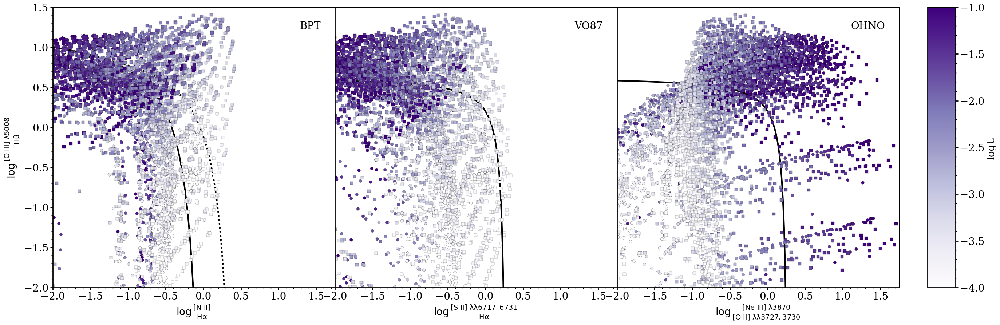

In [11]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1)
colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1, marker='s')
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 1.5)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1, marker='s')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 1.5)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1, marker='s')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 1.5)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'logU')

plt.show()

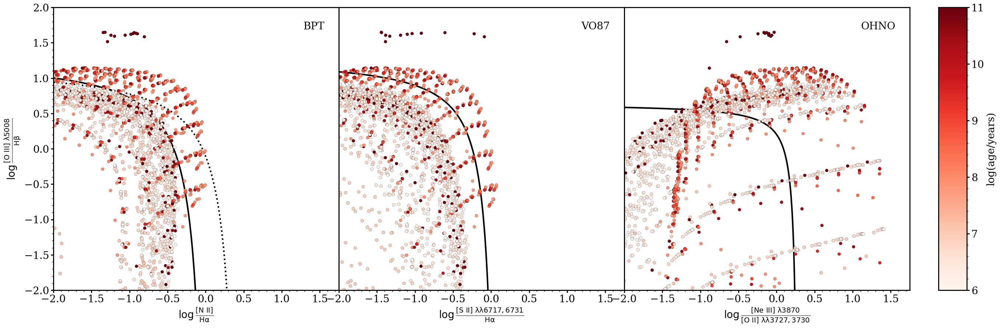

In [209]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['age'], ec='k', linewidths=0.2, cmap='Reds', vmin=6, vmax=11)
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['age'], ec='k', linewidths=0.2, cmap='Reds', vmin=6, vmax=11)
plot_vo87_trump_2015(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['age'], ec='k', linewidths=0.2, cmap='Reds', vmin=6, vmax=11)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'log(age/years)')

plt.show()

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


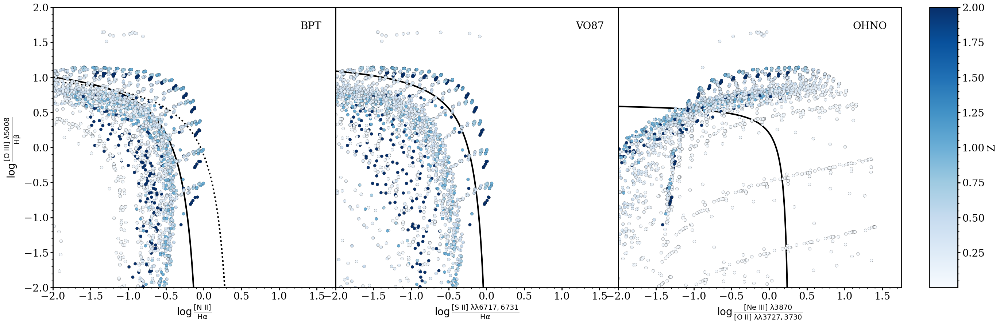

In [210]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['zgas'], ec='k', linewidths=0.2, cmap='Blues')
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['zgas'], ec='k', linewidths=0.2, cmap='Blues')
plot_vo87_trump_2015(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=linesdf['zgas'], ec='k', linewidths=0.2, cmap='Blues')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'Z')

plt.show()

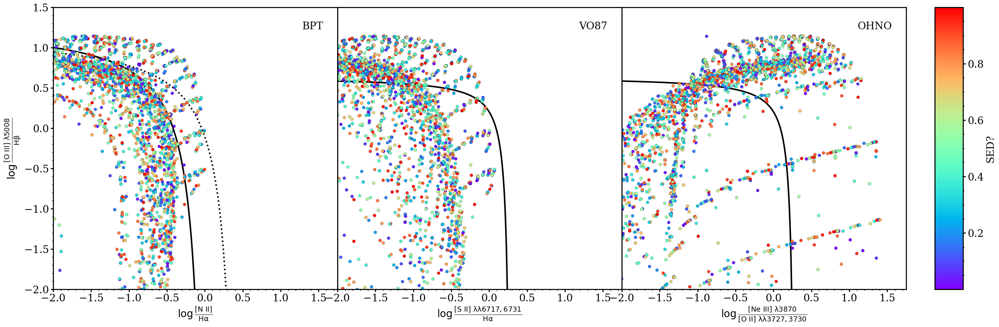

In [10]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
colorbar_data = ax.scatter(np.log10(linesdf['N_2_6583.45A']/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=np.random.rand(len(linesdf)), ec='k', linewidths=0.2, cmap='rainbow')
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 1.5)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.scatter(np.log10((linesdf['S_2_6716.44A']+linesdf['S_2_6730.82A'])/linesdf['H_1_6562.81A']), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=np.random.rand(len(linesdf)), ec='k', linewidths=0.2, cmap='rainbow')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 1.5)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.scatter(np.log10(linesdf['Ne_3_3868.76A']/(linesdf['O_2_3726.03A']+linesdf['O_2_3728.81A'])), np.log10(linesdf['O_3_5006.84A']/linesdf['H_1_4861.33A']), 
           c=np.random.rand(len(linesdf)), ec='k', linewidths=0.2, cmap='rainbow')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 1.5)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'SED?')

plt.show()

In [ ]:
catalog = pd.DataFrame()
for ilin in tqdm(glob.glob(f"{BPASS_135_300_single_hden3_path}**.ilin")):
    parameters = ilin.replace(BPASS_135_300_single_hden3_path, '').replace('.ilin', '')
    try:
        catalog[parameters] = clean_cloudy_line_file(ilin, name=parameters).copy()
    except:
        print(ilin)
        pass

linesdf = catalog.T
linesdf['logU'] = None
linesdf['zgas'] = None
linesdf['hden'] = None
linesdf['zstar'] = None
linesdf['age'] = None
linesdf['sed'] = None

for id, row in linesdf.iterrows():
    logU = float(id.rsplit('logU')[-1])
    zgas = float(id.replace(f'_logU{logU}', '').rsplit('z')[-1])
    hden = int(id.replace(f'_z{zgas}_logU{logU}', '').rsplit('hden')[-1])
    zstar = float(id.replace(f'_hden{hden}_z{zgas}_logU{logU}', '').rsplit('zstar')[-1])
    age = float(id.replace(f'_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('age')[-1])
    sed = str(id.replace(f'_age{age}_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('sed')[-1])
    linesdf.loc[id, 'logU'] = logU
    linesdf.loc[id, 'zgas'] = zgas
    linesdf.loc[id, 'hden'] = hden
    linesdf.loc[id, 'zstar'] = zstar
    linesdf.loc[id, 'age'] = age
    linesdf.loc[id, 'sed'] = sed

linesdf

In [219]:
BPASS_solar_path = "/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/"
glob.glob(f"{BPASS_solar_path}/**/**/**.ilin")

catalog = pd.DataFrame()
for ilin in tqdm(glob.glob(f"{BPASS_solar_path}/**/**/**.ilin")):
    parameters = ilin.replace(BPASS_solar_path, '').replace('.ilin', '')
    try:
        catalog[parameters] = clean_cloudy_line_file(ilin, name=parameters).copy()
    except:
        print(ilin)
        pass

BPASS_solar = catalog.T
BPASS_solar['logU'] = None
BPASS_solar['zgas'] = None
BPASS_solar['hden'] = None
BPASS_solar['zstar'] = None
BPASS_solar['age'] = None
BPASS_solar['sed'] = None
BPASS_solar['binary_or_single'] = None
BPASS_solar['history'] = None
BPASS_solar['imf'] = None

for id, row in BPASS_solar.iterrows():
    logU = float(id.rsplit('logU')[-1])
    zgas = float(id.replace(f'_logU{logU}', '').rsplit('z')[-1])
    hden = int(id.replace(f'_z{zgas}_logU{logU}', '').rsplit('hden')[-1])
    zstar = float(id.replace(f'_hden{hden}_z{zgas}_logU{logU}', '').rsplit('zstar')[-1])
    age = float(id.replace(f'_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('age')[-1])
    sed = str(id.replace(f'_age{age}_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('sed')[-1])
    binary = str(id.replace(f'.ascii_age{age}_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('_')[-1])
    history = str(id.replace(f'_{binary}.ascii_age{age}_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('_')[-1])
    imf = str(id.replace(f'_{history}_{binary}.ascii_age{age}_zstar{zstar}_hden{hden}_z{zgas}_logU{logU}', '').rsplit('imf')[-1])

    BPASS_solar.loc[id, 'logU'] = logU
    BPASS_solar.loc[id, 'zgas'] = zgas
    BPASS_solar.loc[id, 'hden'] = hden
    BPASS_solar.loc[id, 'zstar'] = zstar
    BPASS_solar.loc[id, 'age'] = age
    BPASS_solar.loc[id, 'sed'] = sed
    BPASS_solar.loc[id, 'binary_or_single'] = binary
    BPASS_solar.loc[id, 'history'] = history
    BPASS_solar.loc[id, 'imf'] = imf

BPASS_solar

BPASS_solar.to_csv('BPASS_solar.csv')

  0%|          | 0/72657 [00:00<?, ?it/s]

/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age11.0_zstar0.05_hden3_z0.05_logU-2.25.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age11.0_zstar0.05_hden3_z0.05_logU-1.75.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age11.0_zstar0.05_hden3_z0.05_logU-2.5.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/BPASS/solar_abundances/hden3/BPASSv2.2.1_imf170_300_burst_binary_models/sedBPASSv2.2.1_imf170_300_burst_binary.ascii_age11.0_zstar0.05_hden3_z0.05_logU-1.25.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_m

NameError: name 'BPASS_solar' is not defined

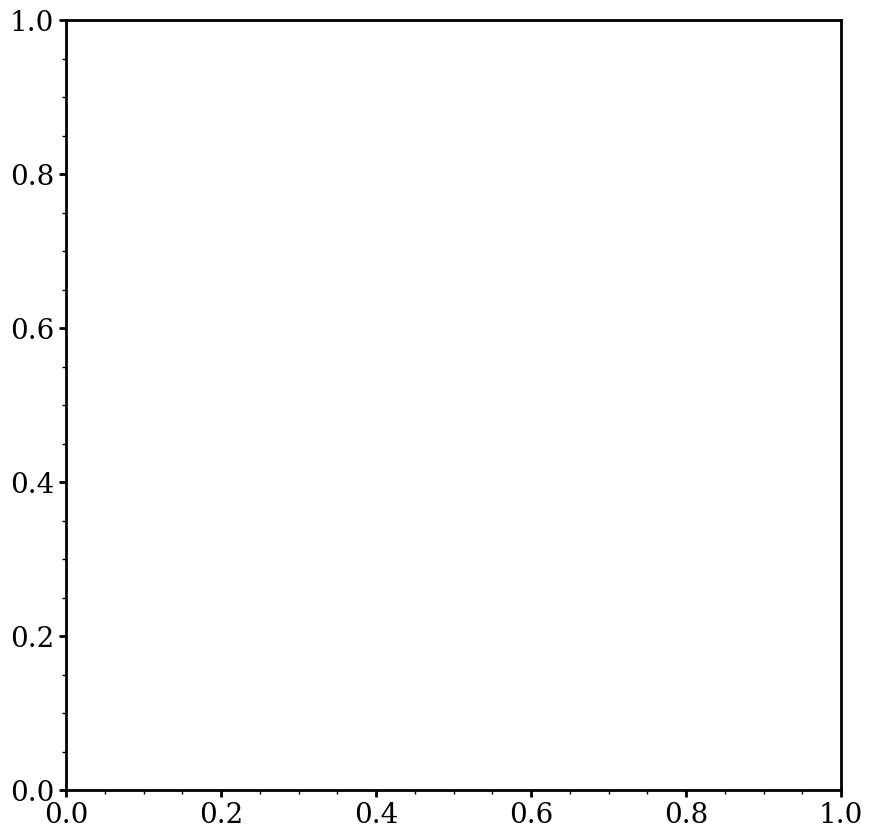

In [9]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
ax.set_rasterized(True)
colorbar_data = ax.scatter(np.log10(BPASS_solar['N_2_6583.45A']/BPASS_solar['H_1_6562.81A']), np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), 
           c=BPASS_solar['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1)
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.set_rasterized(True)
ax.scatter(np.log10((BPASS_solar['S_2_6716.44A']+BPASS_solar['S_2_6730.82A'])/BPASS_solar['H_1_6562.81A']), np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), 
           c=BPASS_solar['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.set_rasterized(True)
ax.scatter(np.log10(BPASS_solar['Ne_3_3868.76A']/(BPASS_solar['O_2_3726.03A']+BPASS_solar['O_2_3728.81A'])), np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), 
           c=BPASS_solar['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
ax.set_rasterized(True)
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'logU')
plt.savefig('diagnostics_BPASS_logU.pdf')

plt.show()

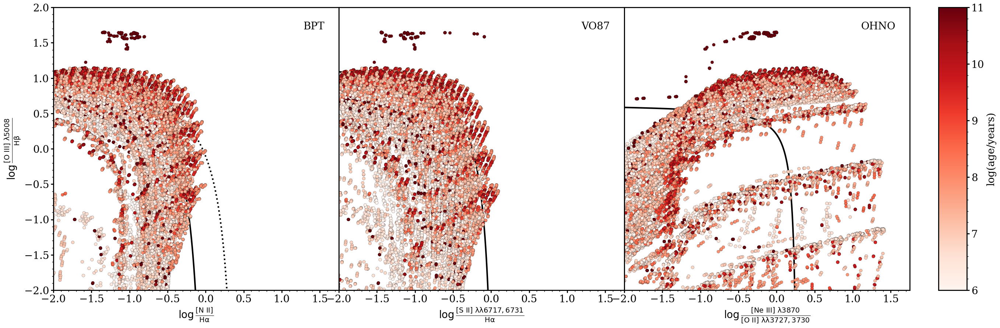

In [293]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
ax.set_rasterized(True)
colorbar_data = ax.scatter(np.log10(BPASS_solar['N_2_6583.45A']/BPASS_solar['H_1_6562.81A']), np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), 
           c=BPASS_solar['age'], ec='k', linewidths=0.2, cmap='Reds', vmin=6, vmax=11)
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.set_rasterized(True)
ax.scatter(np.log10((BPASS_solar['S_2_6716.44A']+BPASS_solar['S_2_6730.82A'])/BPASS_solar['H_1_6562.81A']), np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), 
           c=BPASS_solar['age'], ec='k', linewidths=0.2, cmap='Reds', vmin=6, vmax=11)
plot_vo87_trump_2015(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.set_rasterized(True)
ax.scatter(np.log10(BPASS_solar['Ne_3_3868.76A']/(BPASS_solar['O_2_3726.03A']+BPASS_solar['O_2_3728.81A'])), np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), 
           c=BPASS_solar['age'], ec='k', linewidths=0.2, cmap='Reds', vmin=6, vmax=11)
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
ax.set_rasterized(True)
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'log(age/years)')
plt.savefig('diagnostics_BPASS_age.pdf')

plt.show()

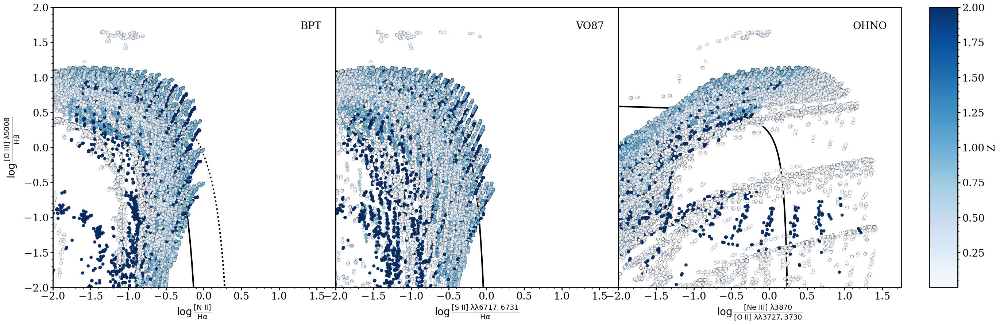

In [292]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
ax.set_rasterized(True)
colorbar_data = ax.scatter(np.log10(BPASS_solar['N_2_6583.45A']/BPASS_solar['H_1_6562.81A']), np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), 
           c=BPASS_solar['zgas'], ec='k', linewidths=0.2, cmap='Blues')
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.set_rasterized(True)
ax.scatter(np.log10((BPASS_solar['S_2_6716.44A']+BPASS_solar['S_2_6730.82A'])/BPASS_solar['H_1_6562.81A']), np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), 
           c=BPASS_solar['zgas'], ec='k', linewidths=0.2, cmap='Blues')
plot_vo87_trump_2015(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.set_rasterized(True)
ax.scatter(np.log10(BPASS_solar['Ne_3_3868.76A']/(BPASS_solar['O_2_3726.03A']+BPASS_solar['O_2_3728.81A'])), np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), 
           c=BPASS_solar['zgas'], ec='k', linewidths=0.2, cmap='Blues')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
ax.set_rasterized(True)
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'Z')

plt.savefig('diagnostics_BPASS_Z.pdf')

plt.show()

In [6]:
# /Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh9/sedmbh9_hden2_z0.1_logU-1.0.ilin

AGN_solar_path = "/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/"

catalog = pd.DataFrame()
for ilin in tqdm(glob.glob(f"{AGN_solar_path}**/**.ilin")):
    parameters = ilin.replace(AGN_solar_path, '').replace('.ilin', '')
    try:
        catalog[parameters] = clean_cloudy_line_file(ilin, name=parameters).copy()
    except:
        print(ilin)
        pass

AGN_solar = catalog.T
AGN_solar['logU'] = None
AGN_solar['zgas'] = None
AGN_solar['hden'] = None
AGN_solar['mbh'] = None

for id, row in AGN_solar.iterrows():
    logU = float(id.rsplit('logU')[-1])
    zgas = float(id.replace(f'_logU{logU}', '').rsplit('z')[-1])
    hden = int(id.replace(f'_z{zgas}_logU{logU}', '').rsplit('hden')[-1])
    mbh = int(id.replace(f'_hden{hden}_z{zgas}_logU{logU}', '').rsplit('mbh')[-1])

    AGN_solar.loc[id, 'logU'] = logU
    AGN_solar.loc[id, 'zgas'] = zgas
    AGN_solar.loc[id, 'hden'] = hden
    AGN_solar.loc[id, 'mbh'] = mbh


AGN_solar

AGN_solar.to_csv('AGN_solar.csv')

  0%|          | 0/3549 [00:00<?, ?it/s]

/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden3_z0.0005_logU-1.0.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden3_z0.005_logU-1.25.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden2_z0.0005_logU-1.5.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden2_z0.0005_logU-2.0.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden2_z0.005_logU-1.0.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden4_z0.0005_logU-1.5.ilin
/Users/njc5787/Research/cloudy_model_library/cloudy_model_library_complete/AGN/solar_abundances/mbh4/sedmbh4_hden4_z0.005_logU-1.5.ilin
/Users/njc5787/Research/cloudy_model_librar

In [224]:
AGN_solar

,N_4_765.147A,N_3_991.000A,C_3_977.020A,C_2_904.142A,C_2_1036.34A,C_2_1037.02A,S_4_1062.66A,H_1_1215.68A,N_5_1238.82A,N_5_1242.80A,...,Ni12_4230.90A,O_3_1660.81A,O_3_1666.15A,O_5_1218.34A,si_3_1892.03A,BLND_2335.00A,logU,zgas,hden,mbh
mbh9/sedmbh9_hden4_z0.7_logU-1.0,0.139460,0.100080,0.633390,0.100880,0.080780,0.094715,0.045843,14.89300,5.480100e-02,3.911400e-02,...,0.000000e+00,0.055674,0.154990,4.218500e-05,0.403720,0.062269,-1.0,0.7,4,9
mbh9/sedmbh9_hden4_z0.5_logU-1.75,0.016113,0.008054,0.108340,0.020640,0.019637,0.022218,0.006772,14.34100,4.247400e-04,2.151100e-04,...,0.000000e+00,0.018965,0.054942,2.754800e-07,0.218140,0.037447,-1.75,0.5,4,9
mbh9/sedmbh9_hden2_z0.4_logU-1.75,0.000153,0.000065,0.001035,0.000223,0.000162,0.000251,0.000054,0.13378,3.208100e-06,1.620700e-06,...,0.000000e+00,0.000132,0.000387,1.453400e-09,0.001319,0.000292,-1.75,0.4,2,9
mbh9/sedmbh9_hden2_z0.5_logU-2.25,0.000034,0.000008,0.000253,0.000072,0.000052,0.000081,0.000014,0.07939,9.340500e-08,4.684000e-08,...,0.000000e+00,0.000017,0.000051,2.410200e-11,0.000262,0.000158,-2.25,0.5,2,9
mbh9/sedmbh9_hden4_z0.4_logU-2.25,0.003679,0.000777,0.026435,0.006531,0.006562,0.007343,0.001508,10.73900,9.199100e-06,4.612700e-06,...,0.000000e+00,0.006188,0.018078,1.372000e-08,0.089205,0.022595,-2.25,0.4,4,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mbh5/sedmbh5_hden3_z0.5_logU-1.5,0.032099,0.007622,0.174860,0.000990,0.000869,0.000989,0.000615,6.01460,3.224200e-01,2.351300e-01,...,1.559100e-04,0.081935,0.240100,6.672900e-01,0.022733,0.033114,-1.5,0.5,3,5
mbh5/sedmbh5_hden3_z0.3_logU-1.25,0.120260,0.007046,0.291840,0.001831,0.001165,0.001418,0.000774,8.08560,6.504700e-01,4.641700e-01,...,1.350900e-03,0.149870,0.439130,1.194700e+00,0.028880,0.025173,-1.25,0.3,3,5
mbh5/sedmbh5_hden2_z0.4_logU-1.5,0.003917,0.000675,0.019803,0.000125,0.000078,0.000132,0.000063,0.70131,3.412700e-02,2.452800e-02,...,1.534600e-05,0.008271,0.024234,6.629300e-02,0.002115,0.002896,-1.5,0.4,2,5
mbh5/sedmbh5_hden3_z0.1_logU-2.0,0.009330,0.001183,0.099707,0.000460,0.000511,0.000626,0.000442,13.00100,6.349500e-02,3.588800e-02,...,2.726400e-07,0.018338,0.053707,7.303000e-02,0.005861,0.007294,-2.0,0.1,3,5


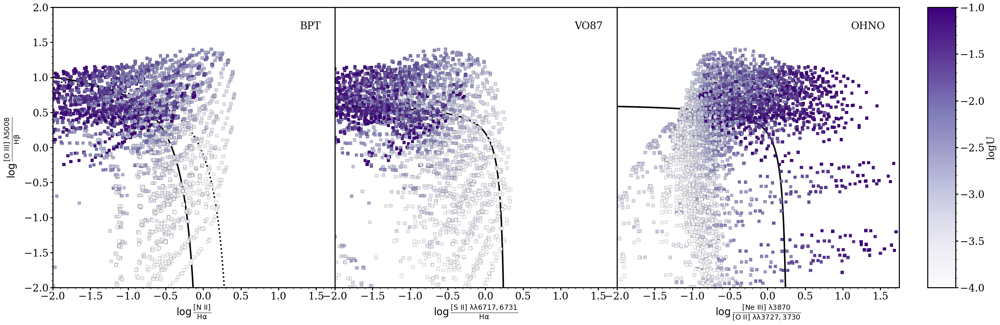

In [291]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
ax.set_rasterized(True)
colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1, marker='s')
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.set_rasterized(True)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1, marker='s')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.set_rasterized(True)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['logU'], ec='k', linewidths=0.2, cmap='Purples', vmin=-4, vmax=-1, marker='s')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
ax.set_rasterized(True)
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'logU')

plt.savefig('diagnostics_AGN_logU.pdf')
plt.show()

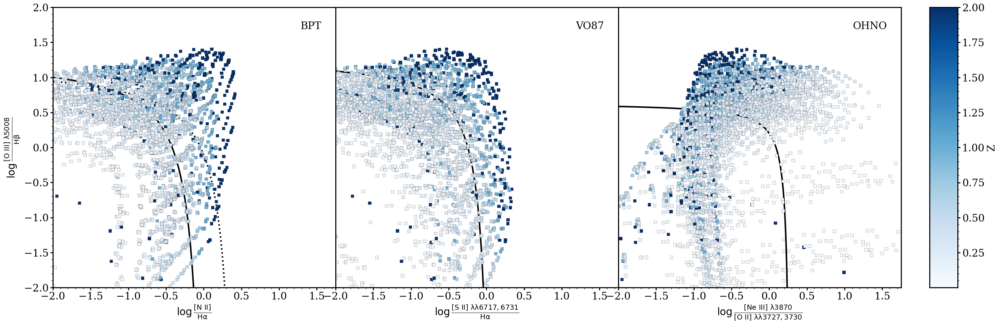

In [ ]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
ax.set_rasterized(True)
colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['zgas'], ec='k', linewidths=0.2, cmap='Blues', marker='s')
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.set_rasterized(True)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['zgas'], ec='k', linewidths=0.2, cmap='Blues', marker='s')
plot_vo87_trump_2015(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.set_rasterized(True)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['zgas'], ec='k', linewidths=0.2, cmap='Blues', marker='s')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
ax.set_rasterized(True)
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'Z')
plt.savefig('diagnostics_AGN_Z.pdf')

plt.show()

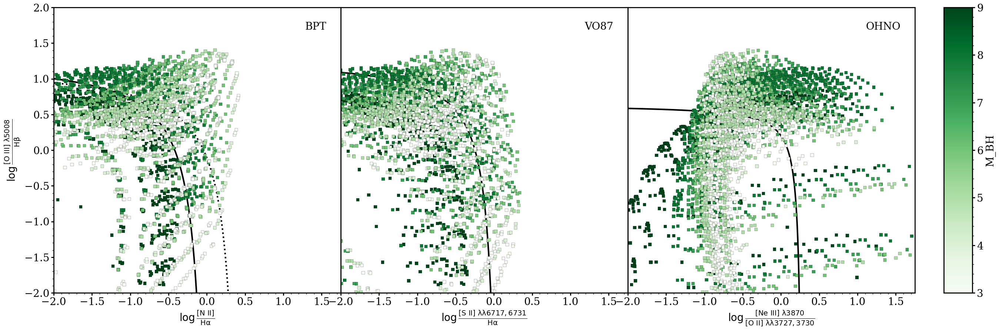

In [288]:
fig = plt.figure(figsize=(32,10))
gs = GridSpec(nrows=10, ncols=32)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:10, 0:10])
ax.set_rasterized(True)
colorbar_data = ax.scatter(np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['mbh'], ec='k', linewidths=0.2, cmap='Greens', marker='s')
plot_bpt_kewley_2001(ax)
plot_bpt_kauffmann_2003(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')
ax.annotate('BPT', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 10:20])
ax.set_rasterized(True)
ax.scatter(np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['mbh'], ec='k', linewidths=0.2, cmap='Greens', marker='s')
plot_vo87_trump_2015(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[S~II]}~\lambda\lambda6717,6731}{\rm{H}\alpha}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('VO87', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 20:30])
ax.set_rasterized(True)
ax.scatter(np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), 
           c=AGN_solar['mbh'], ec='k', linewidths=0.2, cmap='Greens', marker='s')
plot_ohno_backhaus_2022(ax)
ax.set_xlim(-2, 1.75)
ax.set_ylim(-2, 2)
ax.set_xlabel(r'$\log\frac{\rm{[Ne~III]}~\lambda3870}{\rm{[O~II]}~\lambda\lambda3727,3730}$')
ax.tick_params(left=False, labelleft=False, which='both')
ax.annotate('OHNO', xy=(0.95, 0.95), xycoords='axes fraction', ha='right', va='top')

ax = fig.add_subplot(gs[0:10, 31:32])
ax.set_rasterized(True)
fig.colorbar(colorbar_data, ax, use_gridspec=True, label = 'M_BH')
plt.savefig('diagnostics_AGN_logmbh.pdf')

plt.show()

/opt/miniconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


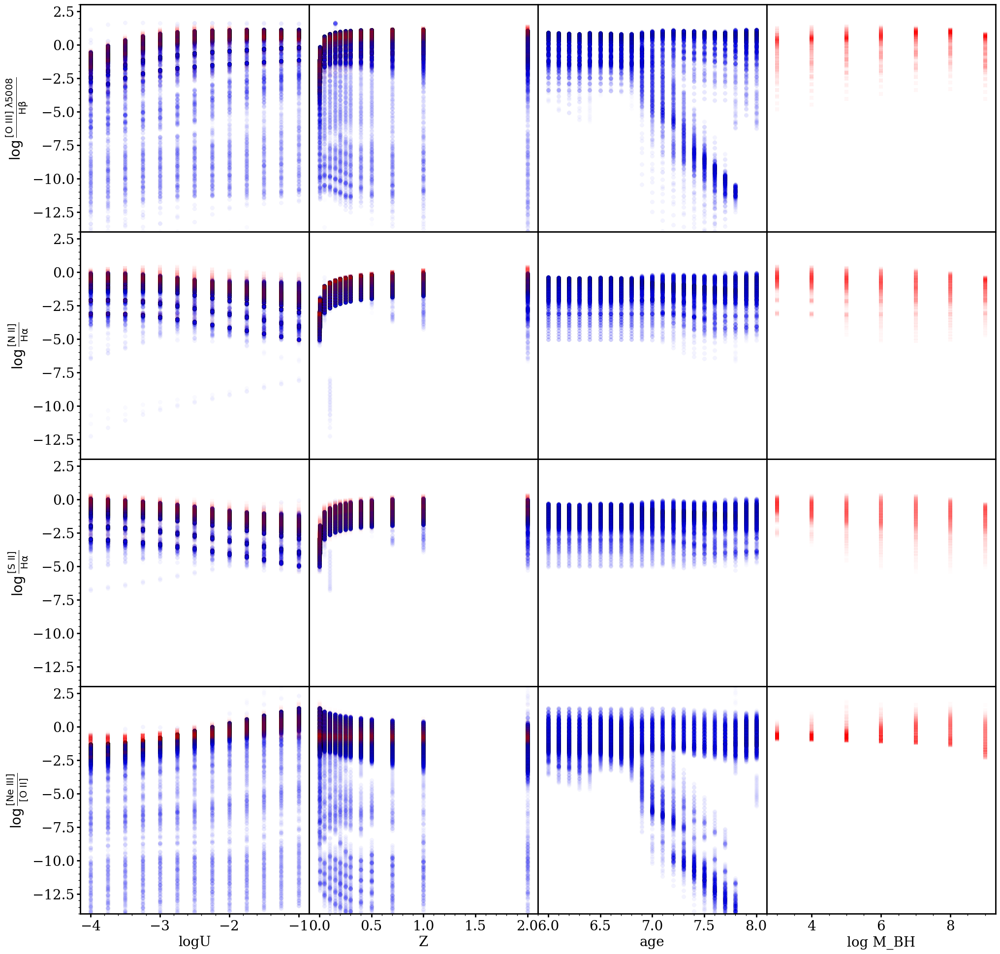

In [287]:
fig = plt.figure(figsize=(24,24))
gs = GridSpec(nrows=4, ncols=4)
gs.update(wspace=0.0, hspace=0.0)

ax = fig.add_subplot(gs[0:1, 0:1])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['logU'], np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.scatter(AGN_solar['logU'], np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_ylim(-14, 3)
ax.set_xlabel(r'logU')
ax.set_ylabel(r'$\log\frac{\rm{[O~III]}~\lambda5008}{\rm{H}\beta}$')

ax = fig.add_subplot(gs[0:1, 1:2])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['zgas'], np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.scatter(AGN_solar['zgas'], np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'Z')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[0:1, 2:3])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['age'], np.log10(BPASS_solar['O_3_5006.84A']/BPASS_solar['H_1_4861.33A']), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.set_xlabel(r'age')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_xlim(5.9, 8.1)
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[0:1, 3:4])
ax.set_rasterized(True)
ax.scatter(AGN_solar['mbh'], np.log10(AGN_solar['O_3_5006.84A']/AGN_solar['H_1_4861.33A']), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'log M_BH')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[1:2, 0:1])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['logU'], np.log10(BPASS_solar['N_2_6583.45A']/BPASS_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.scatter(AGN_solar['logU'], np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'logU')
ax.set_ylabel(r'$\log\frac{\rm{[N~II]}}{\rm{H}\alpha}$')
ax.set_ylim(-14, 3)


ax = fig.add_subplot(gs[1:2, 1:2])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['zgas'], np.log10(BPASS_solar['N_2_6583.45A']/BPASS_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.scatter(AGN_solar['zgas'], np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'Z')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[1:2, 2:3])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['age'], np.log10(BPASS_solar['N_2_6583.45A']/BPASS_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.set_xlabel(r'age')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_xlim(5.9, 8.1)
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[1:2, 3:4])
ax.set_rasterized(True)
ax.scatter(AGN_solar['mbh'], np.log10(AGN_solar['N_2_6583.45A']/AGN_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'log M_BH')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[2:3, 0:1])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['logU'], np.log10((BPASS_solar['S_2_6716.44A']+BPASS_solar['S_2_6730.82A'])/BPASS_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.scatter(AGN_solar['logU'], np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'logU')
ax.set_ylabel(r'$\log\frac{\rm{[S~II]}}{\rm{H}\alpha}$')
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[2:3, 1:2])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['zgas'], np.log10((BPASS_solar['S_2_6716.44A']+BPASS_solar['S_2_6730.82A'])/BPASS_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.scatter(AGN_solar['zgas'], np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'Z')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[2:3, 2:3])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['age'], np.log10((BPASS_solar['S_2_6716.44A']+BPASS_solar['S_2_6730.82A'])/BPASS_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.set_xlabel(r'age')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_xlim(5.9, 8.1)
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[2:3, 3:4])
ax.set_rasterized(True)
ax.scatter(AGN_solar['mbh'], np.log10((AGN_solar['S_2_6716.44A']+AGN_solar['S_2_6730.82A'])/AGN_solar['H_1_6562.81A']), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'log M_BH')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[3:4, 0:1])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['logU'], np.log10(BPASS_solar['Ne_3_3868.76A']/(BPASS_solar['O_2_3726.03A']+BPASS_solar['O_2_3728.81A'])), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.scatter(AGN_solar['logU'], np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'logU')
ax.set_ylabel(r'$\log\frac{\rm{[Ne~III]}}{\rm{[O~II]}}$')
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[3:4, 1:2])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['zgas'], np.log10(BPASS_solar['Ne_3_3868.76A']/(BPASS_solar['O_2_3726.03A']+BPASS_solar['O_2_3728.81A'])), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.scatter(AGN_solar['zgas'], np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'Z')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_ylim(-14, 3)

ax = fig.add_subplot(gs[3:4, 2:3])
ax.set_rasterized(True)
ax.scatter(BPASS_solar['age'], np.log10(BPASS_solar['Ne_3_3868.76A']/(BPASS_solar['O_2_3726.03A']+BPASS_solar['O_2_3728.81A'])), ec='k', linewidths=0.2, marker='o', c='blue', alpha=0.01)
ax.set_xlabel(r'age')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_xlim(5.9, 8.1)
ax.set_ylim(-14, 3)


ax = fig.add_subplot(gs[3:4, 3:4])
ax.set_rasterized(True)
ax.scatter(AGN_solar['mbh'], np.log10(AGN_solar['Ne_3_3868.76A']/(AGN_solar['O_2_3726.03A']+AGN_solar['O_2_3728.81A'])), ec='k', linewidths=0.2, marker='s', c='red', alpha=0.01)
ax.set_xlabel(r'log M_BH')
ax.tick_params(left=False, labelleft=False, which='both')
ax.set_ylim(-14, 3)

plt.savefig('line_ratios.pdf')

plt.show()